In [4]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.cluster import HDBSCAN
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
from umap import UMAP

import models
from data_frame import DataFrame, MaxFiller, MAGNITUDES, COLORS
from histogram_plotter import HistPlotter
from utils import load_config, load_model

DATAPATH = "../dataframes/experiment3/MG_3_components_3.csv"

df = pd.read_csv(DATAPATH, index_col=0)
df, indices = df.loc[(df["split"] == "test") & (~df["faint"]) & (~df["has_missing"])], df.index
columns_100 = df.columns[-100:]

<b>Korelacje</b>

In [55]:
df[COLORS + ["Z_pred_std"]].corr().iloc[-1,:].sort_values(ascending=False)

Z_pred_std    1.000000
u-Ks          0.258383
i1-Ks         0.245127
u-J           0.235219
u-H           0.234042
i1-J          0.231240
i2-Ks         0.227571
Z-Ks          0.227144
u-Y           0.224418
g-Ks          0.210336
u-r           0.209916
i1-Y          0.209742
i1-H          0.208354
r-Ks          0.202904
i2-J          0.200217
Z-J           0.200082
u-Z           0.198542
i2-H          0.187379
u-g           0.186517
g-J           0.186103
u-i2          0.181773
g-H           0.178618
u-i1          0.176113
Z-Y           0.173293
r-J           0.172853
g-Y           0.170543
Z-H           0.170110
Y-Ks          0.167638
i2-Y          0.165835
r-H           0.164271
J-Ks          0.147269
r-Y           0.145993
g-r           0.134928
g-Z           0.124048
i1-Z          0.117829
H-Ks          0.116990
Y-H           0.093032
g-i2          0.090668
Y-J           0.088420
g-i1          0.078665
i2-Z          0.074263
r-Z           0.064985
J-H           0.043510
i1-i2      

<b>Redukcja wymiarów - T-sne</b>

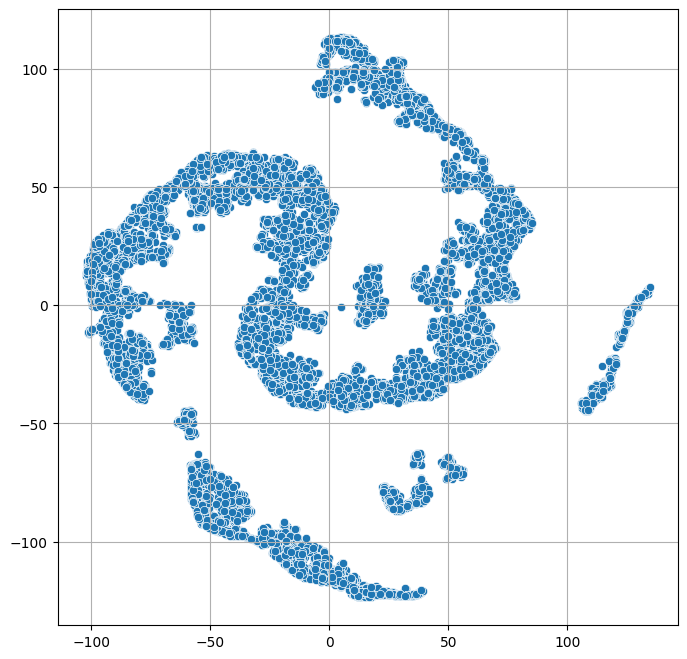

In [6]:
X_scaled = StandardScaler().fit_transform(df[columns_100])
X_emb = TSNE(n_components=2, perplexity=50, learning_rate=200, max_iter=8000,
             init="random", metric="correlation", random_state=0, n_jobs=-1).fit_transform(X_scaled)

plt.figure(figsize=(8,8))
sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1])
plt.grid()
plt.show()

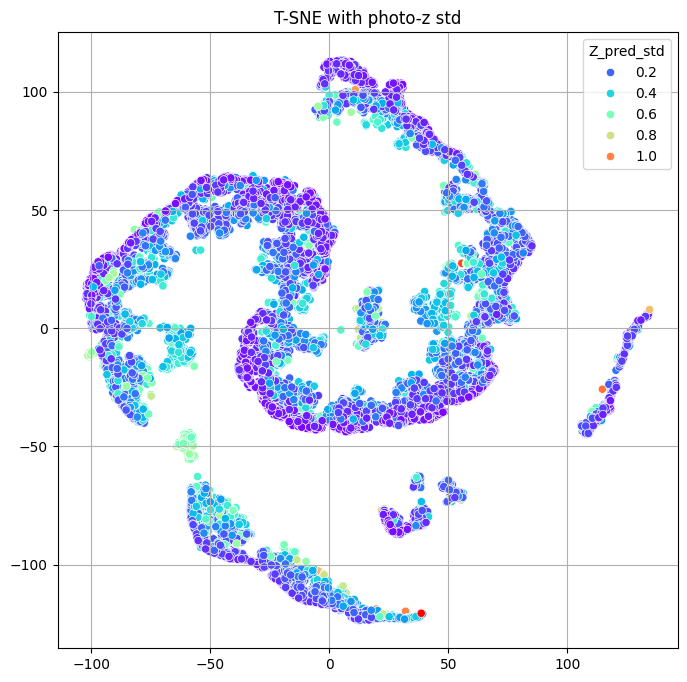

In [7]:
plt.figure(figsize=(8,8))
sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=df["Z_pred_std"], palette="rainbow")
plt.grid()
plt.title("T-SNE with photo-z std")
plt.show()

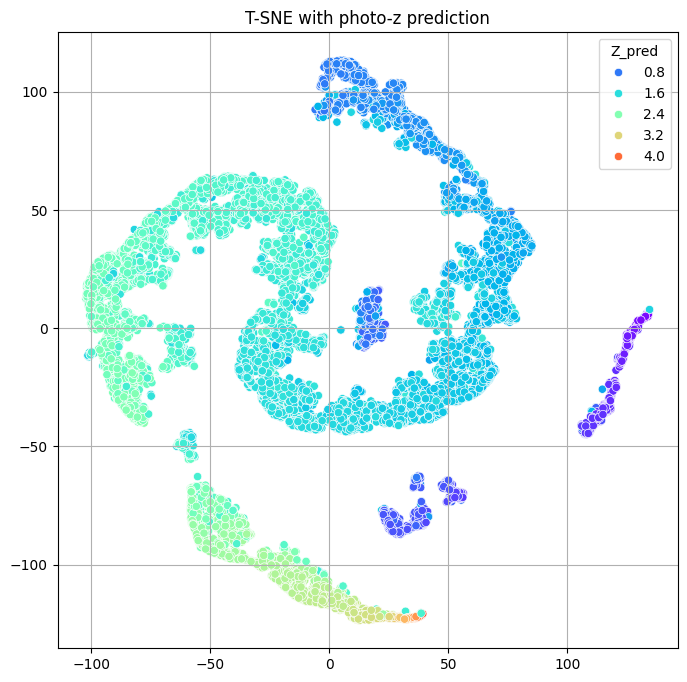

In [8]:
plt.figure(figsize=(8,8))
sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=df["Z_pred"], palette="rainbow")
plt.grid()
plt.title("T-SNE with photo-z prediction")
plt.show()

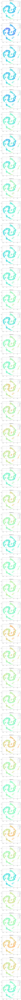

In [9]:
fig, axes = plt.subplots(45, 1, figsize=(7,360))
for ax, color in zip(axes, COLORS):
    sns.scatterplot(x=X_emb[:, 0], y=X_emb[:, 1], hue=df[color], palette="rainbow", ax=ax)
    ax.grid(True)
    ax.set_title(f"T-SNE with {color}")
plt.show()